In [35]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import os

import pandas as pd
import pickle
import IPython.display as ipd

In [4]:
evaluations = [
    ["0", "../../workspace/exp-models/0"],
    ["1a", "../../workspace/exp-models/1a"],
    ["1c", "../../workspace/exp-models/1c"],
    ["1d", "../../workspace/exp-models/1d"],
    ["1e", "../../workspace/exp-models/1e"],
    ["1f", "../../workspace/exp-models/1f"],
    ["1g", "../../workspace/exp-models/1g"],
    ["1h", "../../workspace/exp-models/1h"],
    ["1i", "../../workspace/exp-models/1i"],
    
    ["2a", "../../workspace/exp-models/2a"],
    ["2b", "../../workspace/exp-models-gpu3/2b"],
    ["2d", "../../workspace/exp-models/2d"],
    
    ["3a", "../../workspace/exp-models/3a"],
    ["3b", "../../workspace/exp-models-gpu3/3b"],
    ["3c", "../../workspace/exp-models-gpu3/3c"],
    ["3d", "../../workspace/exp-models-gpu3/3d"],
    
    ["4a", "../../workspace/exp-models-gpu3/4a"],
    ["4b", "../../workspace/exp-models-gpu3/4b"],
    ["4c", "../../workspace/exp-models-gpu3/4c"],
    
    ["5a", "../../workspace/exp-models-gpu3/5a"],
    ["5b", "../../workspace/exp-models-gpu3/5b"],
    ["5c", "../../workspace/exp-models-gpu3/5c"],
    ["gru", "../../workspace/exp-models-gpu3/gru"],
]

In [32]:
def load(pkl):
     return pickle.load(open("../../workspace/eval/evaluation-results/" + pkl, "rb"))

eval_results = list(filter(lambda result: result[2] != '2b', load("0-2a.pkl"))) + load("2b-3a.pkl") + load("3b-3d.pkl") + load("4a-4c.pkl") + load("5a-5c.pkl") + load("gru.pkl")

0


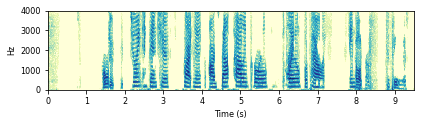

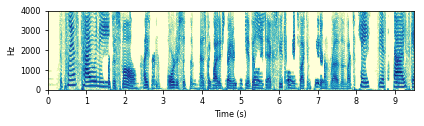

1a


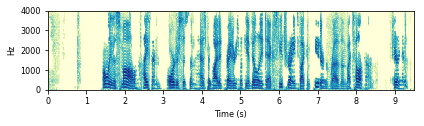

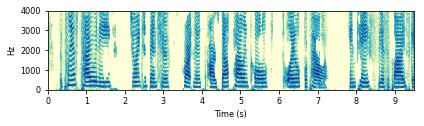

1c


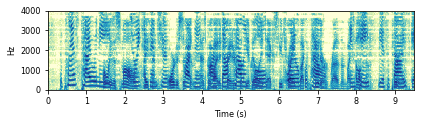

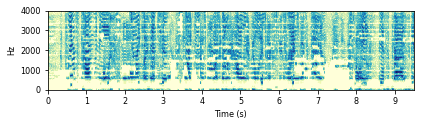

1d


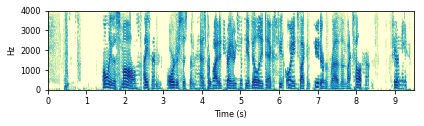

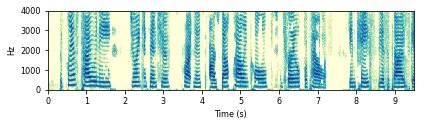

1e


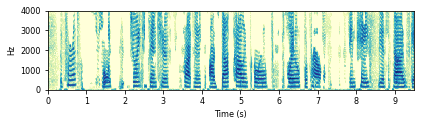

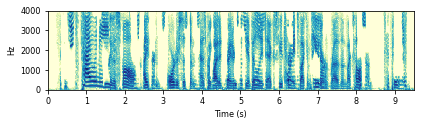

1f


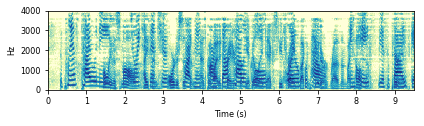

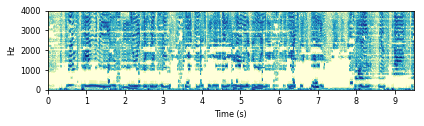

1g


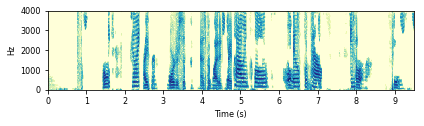

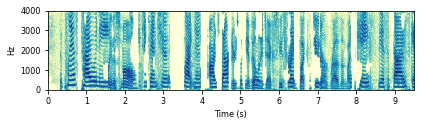

1h


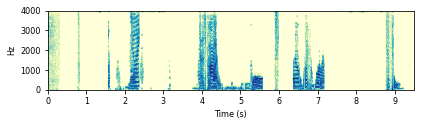

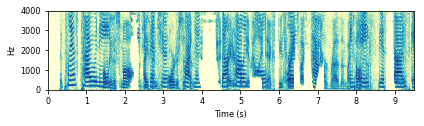

1i


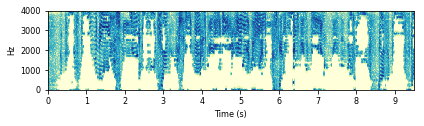

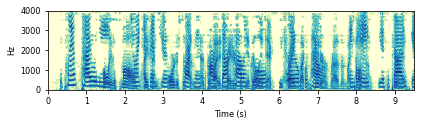

2a


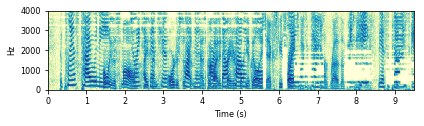

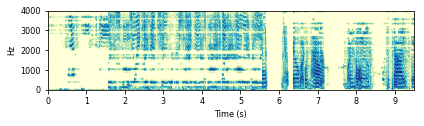

2b


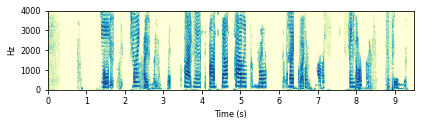

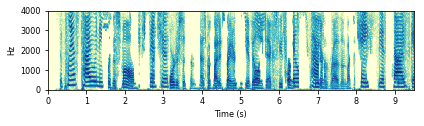

2d


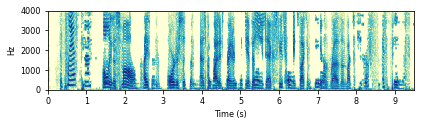

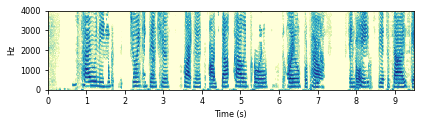

3a


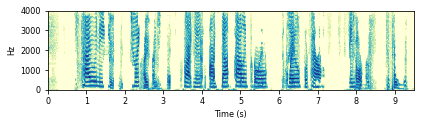

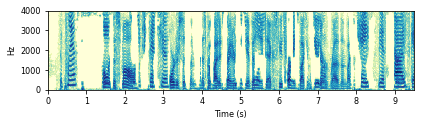

3b


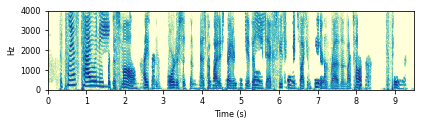

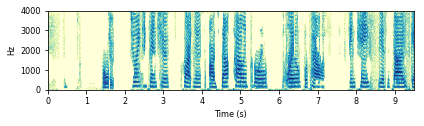

3c


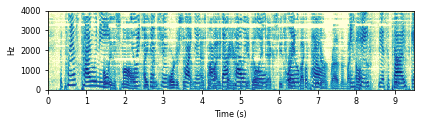

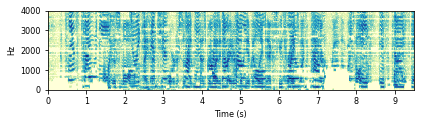

3d


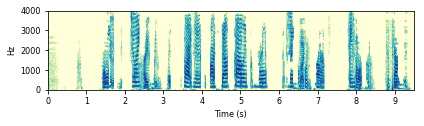

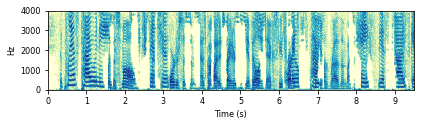

4a


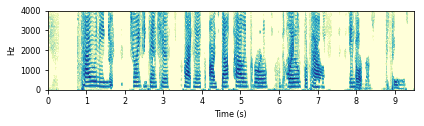

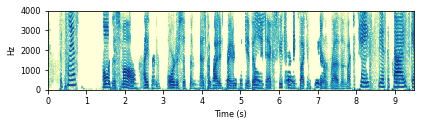

4b


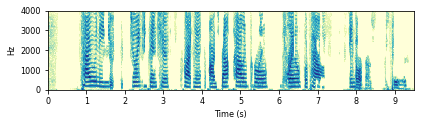

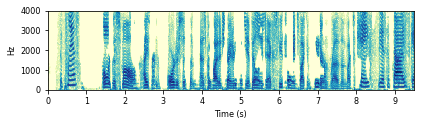

4c


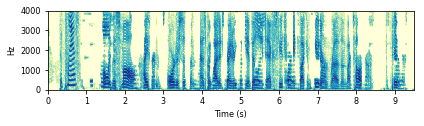

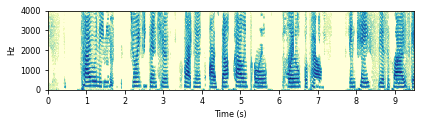

5a


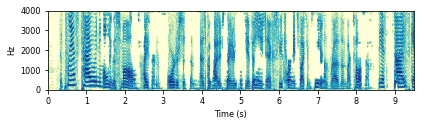

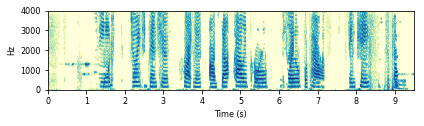

5b


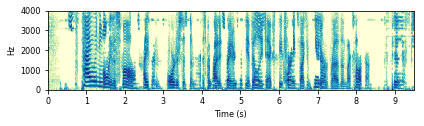

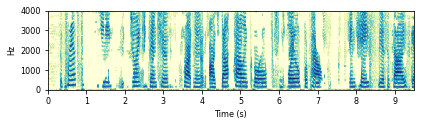

5c


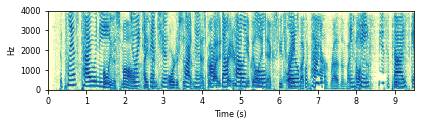

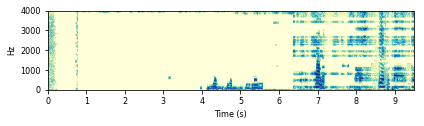

gru


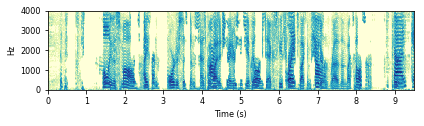

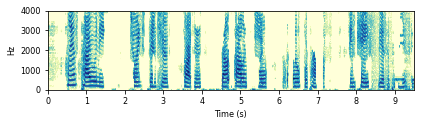

In [38]:
def spectogram(source):
    spec = librosa.core.stft(source, n_fft=256, hop_length=64, window=np.hanning, center=False)
    
    fig, ax1 = plt.subplots(figsize=(6,1.85))
    ax1.tick_params(axis="x", labelsize=FONT_SIZE)
    ax1.tick_params(axis="y", labelsize=FONT_SIZE)
    ax1.set_ylabel("", fontsize = FONT_SIZE)
    ax1.set_xlabel("", fontsize = FONT_SIZE)
    librosa.display.specshow(librosa.amplitude_to_db(np.abs(spec)), sr=8000, hop_length=64, y_axis='linear', x_axis='s', cmap='YlGnBu', ax=ax1) 
    plt.tight_layout()
    fig.savefig("../../workspace/figures/masking_demonstration-3.pdf", bbox_inches='tight',pad_inches = 0, dpi=1200)
    plt.show()

FONT_SIZE = 8
sampling_rate=8000
dataset="wsj0_train"
for (name, model) in evaluations:
    print(name)
    byModel = list(filter(lambda result: result[2] == name, eval_results))
    assert len(byModel) == 6
    
    byDataset = list(filter(lambda result: result[3] == dataset, byModel))
    assert len(byDataset) == 1
    
    idx = 1
    
    metrics, mixes, reference, labels, sources = byModel[0][-1]

    mix = mixes[idx]
    source1, source2 = sources[idx]
    ref1, ref2 = reference[idx]
    display(ipd.Audio(mix, rate=sampling_rate))
    display(ipd.Audio(source1, rate=sampling_rate))
    spectogram(source1)
    display(ipd.Audio(source2, rate=sampling_rate))
    spectogram(source2)
    
    